## Procesamiento de Imágenes - Diplodatos 2024

Trabajo Práctico

Importante: Para obtener los créditos de materia completa, resolver al menos 1 ejercicio optativo de cada trabajo práctico.


In [18]:
integrantes = ["Juan Cruz Gonzalez", "Griselda Itovich", "Emanuel Nicolás Herrador"]
print(*integrantes, sep="\n")

Juan Cruz Gonzalez
Griselda Itovich
Emanuel Nicolás Herrador


Importar las librerías necesarias


In [33]:
import imageio as iio
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import widgets
from scipy import ndimage as ndi
%matplotlib inline

Abrir imágenes de demo incluídas en la biblioteca. Para evitar cargar desde disco, pueden utilizar estas imágenes para resolver el TP. Si utilizan otras adjuntarlas en la entrega para reproducibilidad.


/tmp/ipykernel_90033/185470285.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images_dict[key] = iio.imread(f'imageio:{key}')


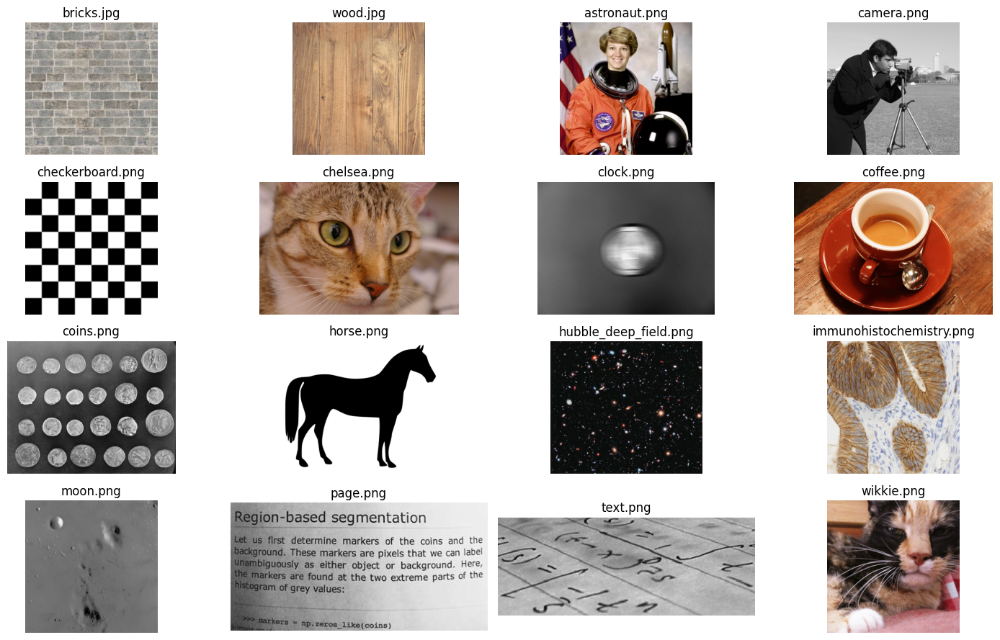

In [20]:
images_dict = {"bricks.jpg": None, "wood.jpg": None, "astronaut.png": None, "camera.png": None,
               "checkerboard.png": None, "chelsea.png": None, "clock.png": None, "coffee.png": None, "coins.png": None,
               "horse.png": None, "hubble_deep_field.png": None, "immunohistochemistry.png": None, "moon.png": None,
               "page.png": None, "text.png": None, "wikkie.png": None}

for key in images_dict.keys():
    images_dict[key] = iio.imread(f'imageio:{key}')

fig, axs = plt.subplots(4, 4, figsize=(15, 9))
for i, (key, value) in enumerate(images_dict.items()):
    ax = axs[i//4, i % 4]
    if value.ndim == 2:
        ax.imshow(value, cmap='gray')
    else:
        ax.imshow(value)
    ax.axis('off')
    ax.set_title(key)
plt.tight_layout()
plt.show()

# Ejercicio 1.1

La propuesta para esta actividad consiste en manipular independientemente la luminancia y la saturación de una imagen.
Para ello convertimos cada pixel de la imagen del espacio RGB al espacio YIQ, luego alteramos los valores de Y (para cambiar la luminancia) o de IQ (para cambiar la saturación).
Con los nuevos valores de YIQ, convertimos a RGB nuevamente y obtenemos una nueva imagen.

---

Lo primero que hacemos es cargar las matrices que nos permiten movernos entre los distintos espacios de color, y la función que nos ayuda a multiplicar matrices.


In [21]:
MAT_RGB2YIQ = np.array([[0.299, 0.587, 0.114],
                        [0.595716, -0.274453, -0.321263],
                        [0.211456, -0.522591, 0.311135]])

MAT_YIQ2RGB = np.array([[1.0, 0.9663, 0.6210],
                        [1.0, -0.2721, -0.6474],
                        [1.0, -1.1070, 1.7046]])


def apply_matrix(img, M):
    return np.matmul(img.reshape((-1, 3)), M.T).reshape(img.shape)

Con ello, definimos ahora la función que realiza lo pedido por el ejercicio:


In [31]:
def YIQ_modification(img, alpha, beta):
    img_rgb = img / 255

    img_yiq = apply_matrix(img_rgb, MAT_RGB2YIQ)

    img_yiq[..., 0] *= alpha
    img_yiq[..., 1:] *= beta

    img_yiq[..., 0] = np.clip(img_yiq[..., 0], 0, 1)
    img_yiq[..., 1] = np.clip(img_yiq[..., 1], -0.5957, 0.5957)
    img_yiq[..., 2] = np.clip(img_yiq[..., 2], -0.5226, 0.5226)

    img_rgb = apply_matrix(img_yiq, MAT_YIQ2RGB)

    img_rgb = np.clip(img_rgb, 0, 1) * 255
    return img_rgb.astype(np.uint8)

Si nos concentramos en la imagen de _coffee_, podemos ver las siguientes posibles modificaciones realizadas de forma manual:


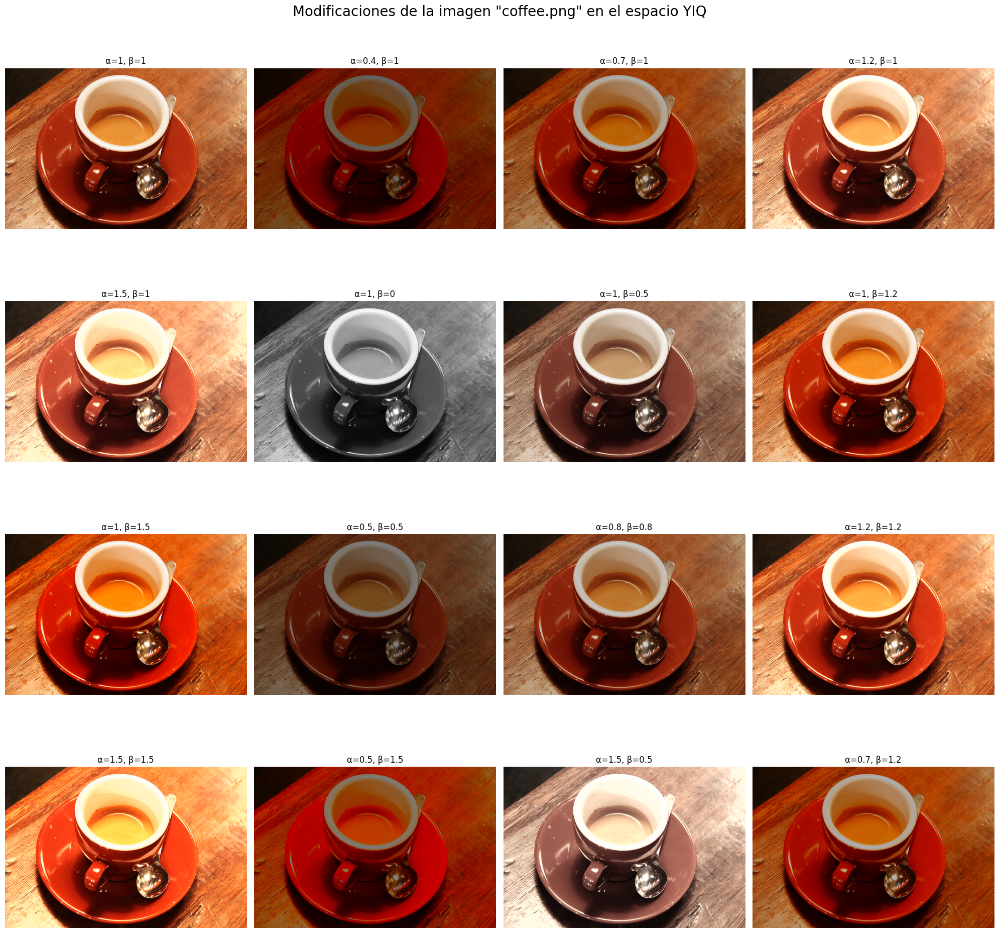

In [23]:
coffee_yiq_modifications = [
    (1, 1),
    (0.4, 1),
    (0.7, 1),
    (1.2, 1),
    (1.5, 1),
    (1, 0),
    (1, 0.5),
    (1, 1.2),
    (1, 1.5),
    (0.5, 0.5),
    (0.8, 0.8),
    (1.2, 1.2),
    (1.5, 1.5),
    (0.5, 1.5),
    (1.5, 0.5),
    (0.7, 1.2)]

fig, axs = plt.subplots(4, 4, figsize=(20, 20))
for i, (alpha, beta) in enumerate(coffee_yiq_modifications):
    img = YIQ_modification(images_dict['coffee.png'], alpha, beta)
    title = f'α={alpha}, β={beta}'

    ax = axs[i // 4, i % 4]
    ax.imshow(img)
    ax.set_title(title)
    ax.axis('off')

fig.suptitle('Modificaciones de la imagen "coffee.png" en el espacio YIQ', fontsize=20)
plt.tight_layout()
plt.show()

Sin embargo, otra posibilidad es crear una interacción con el usuario que le permita elegir la imagen que quiere cargar y los valores de luminancia y saturación que quiere modificar. Para ello, se puede utilizar la librería `ipywidgets` que permite crear widgets interactivos en Jupyter Notebook.


In [24]:
image_YIQ_modif = widgets.Dropdown(
    options=images_dict.keys(),
    description='Imagen:'
)
alpha_YIQ_modif = widgets.FloatSlider(
    value=1,
    min=0,
    max=2,
    step=0.05,
    description='Alpha:',
    readout_format='.2f',
)
beta_YIQ_modif = widgets.FloatSlider(
    value=1,
    min=0,
    max=2,
    step=0.05,
    description='Beta:',
    readout_format='.2f',
)


def button_YIQ():
    plt.imshow(YIQ_modification(images_dict[image_YIQ_modif.value], alpha_YIQ_modif.value, beta_YIQ_modif.value))
    plt.axis('off')
    plt.show()


do_YIQ_modification = widgets.Button(description='Do YIQ modification')
do_YIQ_modification.on_click(lambda _: button_YIQ())

widgets.VBox([image_YIQ_modif, alpha_YIQ_modif, beta_YIQ_modif, do_YIQ_modification])

# Ejercicio 1.2

Desarrollar un aplicativo o notebook que pueda abrir una imagen, manipule su histograma de luminancias, y luego ver la imagen procesada. Se debe poder elegir filtro raíz, cuadrado, o lineal a trozos.
Los controles para elegir los filtros los organizan como les resulte más cómodo.

---

Para ello, lo primero que vamos a hacer es definir la función que se encargue de realizar el cambio en el histograma de luminancias según los filtros.


In [25]:
def filter_modification(img, filter, **kwargs):
    img_rgb = img / 255
    img_yiq = apply_matrix(img_rgb, MAT_RGB2YIQ)
    img_Y = img_yiq[..., 0]

    match filter:
        case 'pow2':
            img_Y = np.power(img_Y, 2)
        case 'sqrt':
            img_Y = np.sqrt(img_Y)
        case 'piecewise_linear':
            min_Y, max_Y = kwargs['min_Y'], kwargs['max_Y']
            img_Y[img_Y < min_Y] = 0
            img_Y[img_Y > max_Y] = 1
        case _:
            raise ValueError('Invalid filter')

    img_yiq[..., 0] = img_Y
    img_rgb = apply_matrix(img_yiq, MAT_YIQ2RGB)
    img_rgb = np.clip(img_rgb, 0, 1) * 255
    return img_rgb.astype(np.uint8)

Ahora, podemos probar la función definida anteriormente con la imagen de _chelsea_ (el gato) de forma manual, y comprobar que funciona correctamente:


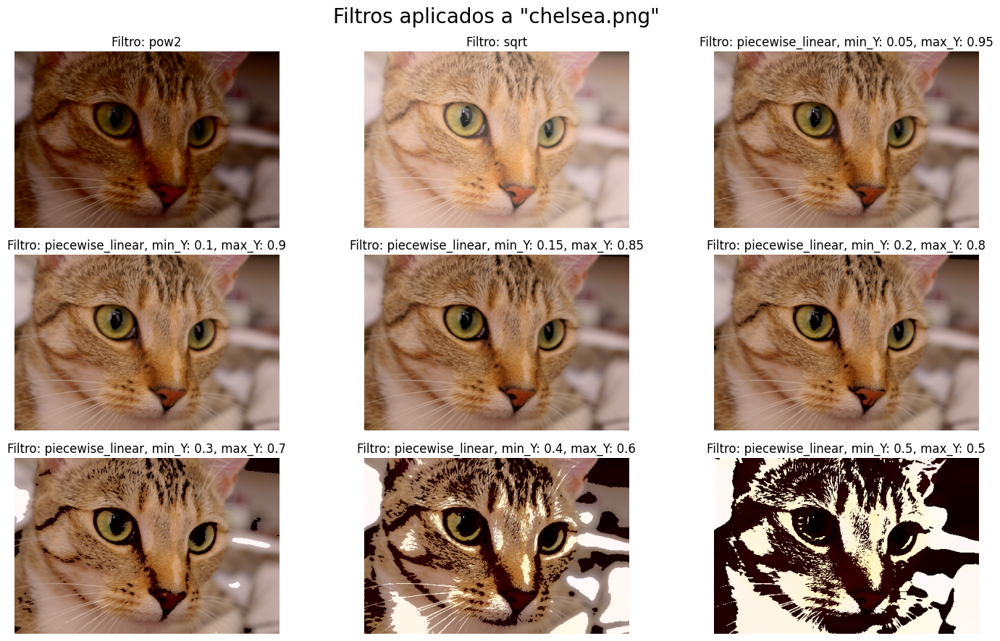

In [26]:
filter_modifications = [
    ('pow2', {}),
    ('sqrt', {}),
    ('piecewise_linear', {'min_Y': 0.05, 'max_Y': 0.95}),
    ('piecewise_linear', {'min_Y': 0.1, 'max_Y': 0.9}),
    ('piecewise_linear', {'min_Y': 0.15, 'max_Y': 0.85}),
    ('piecewise_linear', {'min_Y': 0.2, 'max_Y': 0.8}),
    ('piecewise_linear', {'min_Y': 0.3, 'max_Y': 0.7}),
    ('piecewise_linear', {'min_Y': 0.4, 'max_Y': 0.6}),
    ('piecewise_linear', {'min_Y': 0.5, 'max_Y': 0.5})
]

fig, axs = plt.subplots(3, 3, figsize=(15, 9))
for i, (filter, kwargs) in enumerate(filter_modifications):
    img = filter_modification(images_dict['chelsea.png'], filter, **kwargs)
    if filter == 'piecewise_linear':
        title = f'Filtro: {filter}, min_Y: {kwargs["min_Y"]}, max_Y: {kwargs["max_Y"]}'
    else:
        title = f'Filtro: {filter}'

    ax = axs[i // 3, i % 3]
    ax.imshow(img)
    ax.set_title(title)
    ax.axis('off')

fig.suptitle('Filtros aplicados a "chelsea.png"', fontsize=20)
plt.tight_layout()
plt.show()

Visto esto, implementamos el _aplicativo_ que permite al usuario elegir la foto y el filtro que quiere aplicar.


In [27]:
image_filter_modif = widgets.Dropdown(
    options=images_dict.keys(),
    description='Imagen:'
)
filter_modif_choice = widgets.Dropdown(
    options=['pow2', 'sqrt', 'piecewise_linear'],
    description='Filtro:'
)
min_Y_filter_modif = widgets.FloatSlider(
    value=0.05,
    min=0,
    max=1,
    step=0.05,
    description='Min Y:',
    readout_format='.2f',
)
max_Y_filter_modif = widgets.FloatSlider(
    value=0.95,
    min=0,
    max=1,
    step=0.05,
    description='Max Y:',
    readout_format='.2f',
)


def button_filter():
    plt.imshow(filter_modification(images_dict[image_filter_modif.value], filter_modif_choice.value,
                                   min_Y=min_Y_filter_modif.value, max_Y=max_Y_filter_modif.value))
    plt.axis('off')
    plt.show()


do_filter_modification = widgets.Button(description='Do filter modification')
do_filter_modification.on_click(lambda _: button_filter())

widgets.VBox([image_filter_modif, filter_modif_choice, min_Y_filter_modif, max_Y_filter_modif, do_filter_modification])

# Ejercicio 2.1

Implementar un aplicativo o notebook que levante una imagen en nivel de gris (o que la convierta a YIQ y retenga solo el Y) y aplique el filtrado por convolución aquí visto:

1. Pasabajos: Plano, Bartlett 3x3, Gaussiano 5x5.
2. Detectores de bordes: Laplaciano v4, Sobel 4 orientaciones.
3. Pasabanda.

Respecto del “cierre” de la imagen cerca de los bordes, implementar la técnica no ma- temáticamente perfecta de “repetir” artificialmente filas o columnas cuando estas hagan falta. Por ejemplo, si el kernel es 3x3 y estoy en la primera columna, y no hay ninguna columna a la izquierda, entonces repito la primera columna como si estuviese en la imagen original.

---

Lo primero que vamos a hacer es crear las funciones correspondientes a:

- Crear el filtro que necesitemos según lo marcado en el enunciado del ejercicio
- Aplicar la convolución a la imagen con el filtro seleccionado
- Pasar una imagen RGB a escala de grises

Con ello, podremos crear el aplicativo pedido.


In [28]:
def create_kernel(filter_name):
    match filter_name:
        case 'flat_3x3':
            kernel = np.full((3, 3), 1 / 9)
        case 'bartlett_3x3':
            kernel = np.array([1., 2., 1.])
            kernel = np.outer(kernel, kernel)
            kernel /= np.sum(kernel)
        case 'gaussian_5x5':
            kernel = np.array([1., 4., 6., 4., 1.])
            kernel = np.outer(kernel, kernel)
            kernel /= np.sum(kernel)
        case 'laplace_v4':
            kernel = np.zeros((3, 3))
            kernel[1, 1] = -1
            kernel = ndi.laplace(kernel)
        case 'sobel_north':
            kernel = np.zeros((3, 3))
            kernel[1, 1] = -1
            kernel = ndi.sobel(kernel, axis=0)
        case 'sobel_south':
            kernel = np.zeros((3, 3))
            kernel[1, 1] = 1
            kernel = ndi.sobel(kernel, axis=0)
        case 'sobel_west':
            kernel = np.zeros((3, 3))
            kernel[1, 1] = 1
            kernel = ndi.sobel(kernel, axis=1)
        case 'sobel_east':
            kernel = np.zeros((3, 3))
            kernel[1, 1] = -1
            kernel = ndi.sobel(kernel, axis=1)
        case 'band_pass':
            kernel_small = np.array([1., 2., 1.])
            kernel_small = np.outer(kernel_small, kernel_small)
            kernel_small /= np.sum(kernel_small)
            kernel_small = np.pad(kernel_small, 1)

            kernel_large = np.array([1., 4., 6., 4., 1.])
            kernel_large = np.outer(kernel_large, kernel_large)
            kernel_large /= np.sum(kernel_large)

            kernel = kernel_small - kernel_large
        case _:
            raise ValueError('Invalid filter')

    return kernel


def convolution(img, filter_name):
    kernel = create_kernel(filter_name)
    return ndi.convolve(img, kernel)


def RGB_to_gray(img):
    if img.ndim == 2:
        return img

    img_rgb = img / 255
    img_yiq = apply_matrix(img_rgb, MAT_RGB2YIQ)
    return np.clip(img_yiq[..., 0], 0, 1)

Hecho esto, podemos probar "a mano" que funciona correctamente viendo las conversiones realizadas a la imagen "camera.png":


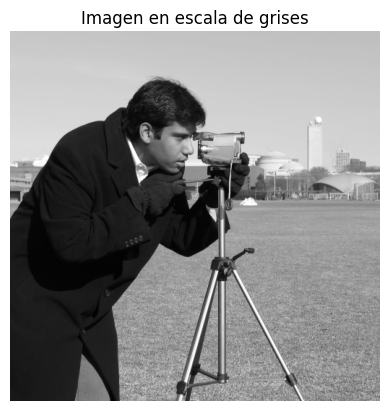

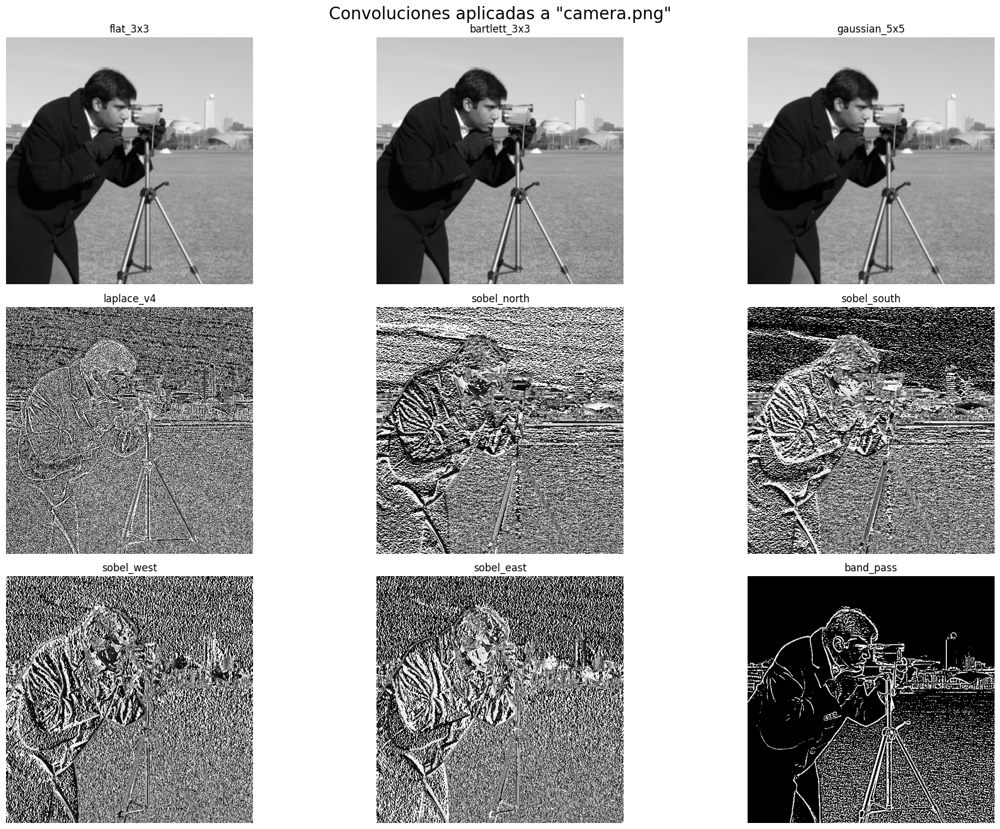

In [29]:
kernel_modifications = [
    'flat_3x3',
    'bartlett_3x3',
    'gaussian_5x5',
    'laplace_v4',
    'sobel_north',
    'sobel_south',
    'sobel_west',
    'sobel_east',
    'band_pass'
]

image_to_see = RGB_to_gray(images_dict['camera.png'])
plt.imshow(image_to_see, cmap='gray')
plt.title('Imagen en escala de grises')
plt.axis('off')

fig, axs = plt.subplots(3, 3, figsize=(20, 14))
for i, filter_name in enumerate(kernel_modifications):
    img = convolution(image_to_see, filter_name)

    ax = axs[i // 3, i % 3]
    ax.imshow(img, cmap='gray')
    ax.set_title(filter_name)
    ax.axis('off')

fig.suptitle('Convoluciones aplicadas a "camera.png"', fontsize=20)
plt.tight_layout()
plt.show()

Con ello, entonces, estamos listos para crear el aplicativo pedido:


In [30]:
image_kernel_modif = widgets.Dropdown(
    options=images_dict.keys(),
    description='Imagen:'
)
filter_kernel_modif = widgets.Dropdown(
    options=kernel_modifications,
    description='Filtro:'
)


def button_kernel():
    img = RGB_to_gray(images_dict[image_kernel_modif.value])
    plt.imshow(convolution(img, filter_kernel_modif.value), cmap='gray')
    plt.axis('off')
    plt.show()


do_kernel_modification = widgets.Button(description='Do kernel modification', layout=widgets.Layout(width='25%'))
do_kernel_modification.on_click(lambda _: button_kernel())

widgets.VBox([image_kernel_modif, filter_kernel_modif, do_kernel_modification])

# Ejercicio 2.2

Desarrollar un aplicativo o notebook que implemente los conceptos de morfología en niveles de gris aquí descriptos, con un elemento estructurante 3x3. El mismo incluirá las siguientes funciones:

- Erosión (tomar el mínimo valor de luminancia de la vecindad).
- Dilatación (máximo)
- Apertura, cierre, borde morfológico
- Mediana
- Top-hat

Incluir la capacidad de copiar la componente de la imagen procesada en la componente original, para poder aplicar dos o más filtrados en secuencia.

---

Lo primero qe vamos a hacer es definir las funciones que nos permitan realizar las operaciones de morfología en niveles de gris.


In [34]:
def apply_morphological_filter(img, filter_name):
    kernel = np.ones((3, 3))
    img_processed = img
    match filter_name:
        case 'erosion':
            img_processed = cv2.erode(img, kernel, iterations=1)
        case 'dilation':
            img_processed = cv2.dilate(img, kernel, iterations=1)
        case 'opening':
            img_processed = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
        case 'closing':
            img_processed = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
        case 'gradient':
            img_processed = cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)
        case 'median':
            img_processed = cv2.medianBlur(img, 3)
        case 'top_hat':
            img_processed = cv2.morphologyEx(img, cv2.MORPH_TOPHAT, kernel)

    return img_processed

Podemos probar las funciones definidas anteriormente con la imagen de _page.png_ de forma manual con el objetivo de comprobar que funcionan correctamente:


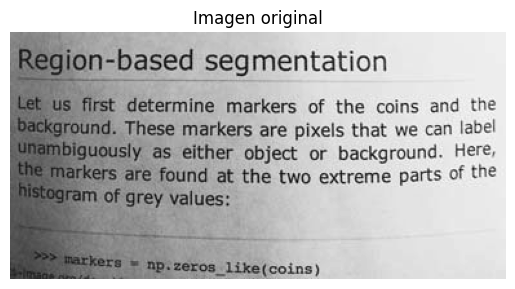

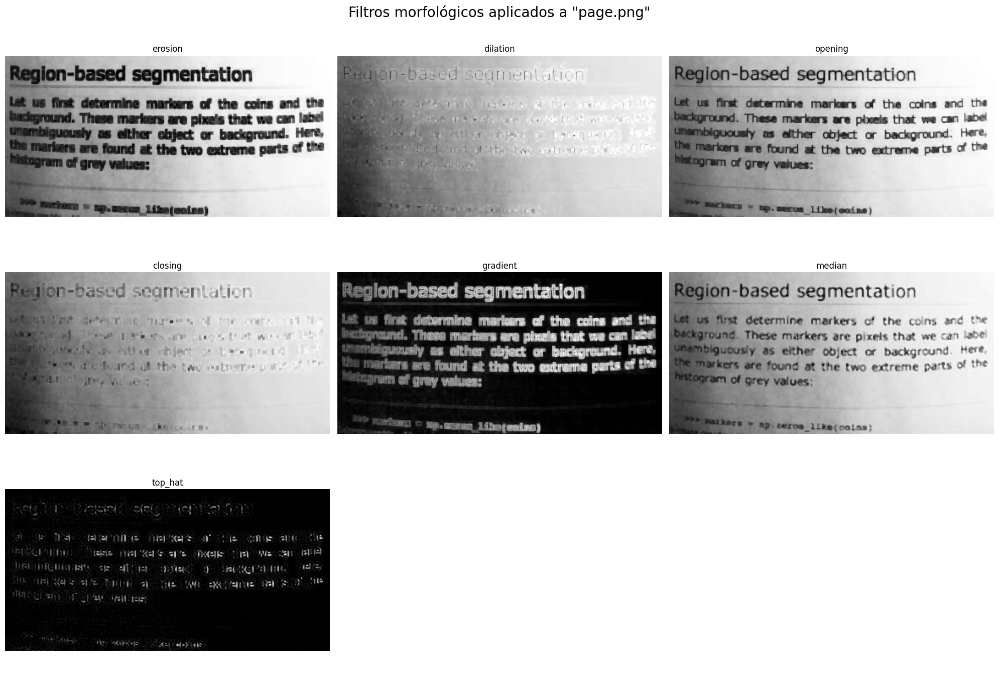

In [38]:
morphological_filters = [
    'erosion',
    'dilation',
    'opening',
    'closing',
    'gradient',
    'median',
    'top_hat'
]

image_to_see = images_dict['page.png']
plt.imshow(image_to_see, cmap='gray')
plt.title('Imagen original')
plt.axis('off')

fig, axs = plt.subplots(3, 3, figsize=(20, 14))
for i, filter_name in enumerate(morphological_filters):
    img = apply_morphological_filter(image_to_see, filter_name)

    ax = axs[i // 3, i % 3]
    ax.imshow(img, cmap='gray')
    ax.set_title(filter_name)
    ax.axis('off')
for j in range(i + 1, 9):
    axs[j // 3, j % 3].axis('off')

fig.suptitle('Filtros morfológicos aplicados a "page.png"', fontsize=20)
plt.tight_layout()
plt.show()

Ahora, implementamos el aplicativo que permite al usuario elegir la imagen y la operación de morfología que quiere aplicar.


In [40]:
image_morphological_modif = widgets.Dropdown(
    options=images_dict.keys(),
    description='Imagen:'
)

filter_morphological_modif = widgets.Dropdown(
    options=morphological_filters,
    description='Filtro:'
)


def button_morphological():
    plt.imshow(
        apply_morphological_filter(
            images_dict[image_morphological_modif.value],
            filter_morphological_modif.value),
        cmap='gray')
    plt.axis('off')
    plt.show()


do_morphological_modification = widgets.Button(
    description='Do morphological modification', layout=widgets.Layout(width='25%'))
do_morphological_modification.on_click(lambda _: button_morphological())

widgets.VBox([image_morphological_modif, filter_morphological_modif, do_morphological_modification])

# Ejercicios Optativos. Ver presentación para más detalle

Recordá que hay ejercicios opcionales especificados en la presentación correspondiente al trabajo práctico.
